In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.nn as nn
import torch.nn.functional as F
from collections import OrderedDict
import torchvision
from torchvision import datasets
from torchvision.transforms import ToTensor
from torchsummary import summary

from sklearn.model_selection import train_test_split


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/Kitchen_items.zip' -d '/content'

Streaming output truncated to the last 5000 lines.
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/3012.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/2972.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/2911.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/2913.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/3004.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/2929.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/3013.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/3064.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/3174.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/3056.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/3103.jpg  
  inflating: /content/content/drive/MyDrive/Kitchen_items/Knife/3039.jpg  
  inflating: /content/content/drive/MyDrive/Kitch

In [ ]:
import cv2
from tqdm import tqdm
import numpy as np
import os

print ('Using PyTorch version :', torch . __version__ )
if torch . cuda . is_available () :
  print ('Using GPU , device name :', torch . cuda . get_device_name (0) )
  device = torch . device ('cuda')
else :
  print ('No GPU found , using CPU instead .')
  device = torch . device ('cpu')


Using PyTorch version : 2.5.1+cu124
Using GPU , device name : Tesla T4


In [ ]:
X = []
Z = []
img_dir = '/content/drive/MyDrive/Kitchen_items'
img_dir = '/content/content/drive/MyDrive/Kitchen_items'
bowl_dir = img_dir + '/Bowl'
glass_dir = img_dir + '/Glass'
knife_dir = img_dir + '/Knife'
spoon_dir = img_dir + '/Spoon'
chopsticks_dir = img_dir + '/Chopsticks'
img_size = 224

def assign_label(img,items):
    return items

def make_train_data(items_dir,DIR):
      for img in tqdm(os.listdir(DIR)):
        label=assign_label(img,items_dir)
        path = os.path.join(DIR,img)

        # Kiểm tra xem cv2.imread có trả về None hay không
        img = cv2.imread(path,cv2.IMREAD_COLOR)
        if img is None:
            print(f"Không thể đọc được ảnh từ đường dẫn: {path}")
            continue # Bỏ qua ảnh này và tiếp tục với ảnh tiếp theo

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (img_size, img_size))
        X.append(np.array(img))
        Z.append(str(label))

In [ ]:
make_train_data('Bowl',bowl_dir)
make_train_data('Glass',glass_dir)
make_train_data('Knife',knife_dir)
make_train_data('Spoon',spoon_dir)
make_train_data('Chopsticks',chopsticks_dir)

100%|██████████| 2002/2002 [01:45<00:00, 19.04it/s]


In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Chuyển nhãn thành số
label_encoder = LabelEncoder()
Z_encoded = label_encoder.fit_transform(Z)
Z_tensor = torch.tensor(Z_encoded, dtype=torch.long)

# 2. Data Augmentation
transform = {
    "train": transforms.Compose([
        transforms.ToPILImage(),
        transforms.RandomResizedCrop(224, scale=(0.5, 1.0)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(90),  # Giảm xoay xuống ±15 độ
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Giảm mức độ thay đổi màu
        transforms.RandomAffine(degrees=0, translate=(0.3, 0.3), shear=20),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        transforms.RandomErasing(p=0.7, scale=(0.02, 0.3), ratio=(0.3, 3.3)),
    ]),
    "val": transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    "test": transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
}
X_train, X_temp, y_train, y_temp = train_test_split(X, Z_tensor, test_size=0.3, random_state=42, stratify=Z_tensor)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

In [ ]:

# Custom Dataset
class KitchenDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

train_dataset = KitchenDataset(X_train, y_train, transform=transform["train"])
val_dataset = KitchenDataset(X_val, y_val, transform=transform["val"])
test_dataset = KitchenDataset(X_test, y_test, transform=transform["test"])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)




In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
import numpy as np

# Thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1. Tải và tùy chỉnh VGG16
vgg16 = models.vgg16(pretrained=True)

# Tùy chỉnh classifier với Dropout
vgg16.classifier = nn.Sequential(
    nn.Linear(25088, 4096),
    nn.ReLU(True),
    nn.Dropout(0.5),  # Dropout 0.5
    nn.Linear(4096, 4096),
    nn.ReLU(True),
    nn.Dropout(0.5),  # Dropout 0.5
    nn.Linear(4096, 5)
)

# Fine-tune ít tầng hơn: Đóng băng đến tầng x, mở từ tầng y
for param in vgg16.features[:31].parameters():
    param.requires_grad = False
for param in vgg16.features[31:].parameters():
    param.requires_grad = True

vgg16 = vgg16.to(device)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# 5. Loss và Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, vgg16.parameters()), lr=0.001, weight_decay=0.0001) #giảm lr
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

# 6. Huấn luyện mô hình
train_losses = []
val_losses = []
train_accs = []
val_accs = []

num_epochs = 50
best_val_loss = float('inf')
patience = 5
counter = 0

for epoch in range(num_epochs):
    vgg16.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = vgg16(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_losses.append(train_loss)
    train_accs.append(train_acc)

    # Validation
    vgg16.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    val_preds = []
    val_labels = []
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = vgg16(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
            val_preds.extend(predicted.cpu().numpy())
            val_labels.extend(labels.cpu().numpy())

    val_loss = val_loss / len(val_loader)
    val_acc = 100 * val_correct / val_total
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    scheduler.step(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        counter = 0
        torch.save(vgg16.state_dict(), '/content/drive/MyDrive/bestmodel/vgg16_best_model.pth')
    else:
        counter += 1
    if counter >= patience:
        print("Early stopping triggered")
        break


Epoch 1/50, Train Loss: 1.2593, Train Acc: 59.87%, Val Loss: 0.4291, Val Acc: 87.65%
Epoch 2/50, Train Loss: 0.8324, Train Acc: 70.35%, Val Loss: 0.3555, Val Acc: 91.11%
Epoch 3/50, Train Loss: 0.8058, Train Acc: 71.30%, Val Loss: 0.3294, Val Acc: 89.89%
Epoch 4/50, Train Loss: 0.7787, Train Acc: 72.63%, Val Loss: 0.3303, Val Acc: 91.04%
Epoch 5/50, Train Loss: 0.7836, Train Acc: 73.27%, Val Loss: 0.2649, Val Acc: 92.20%
Epoch 6/50, Train Loss: 0.7848, Train Acc: 72.95%, Val Loss: 0.3112, Val Acc: 91.11%
Epoch 7/50, Train Loss: 0.7675, Train Acc: 74.39%, Val Loss: 0.2328, Val Acc: 93.89%
Epoch 8/50, Train Loss: 0.7911, Train Acc: 73.04%, Val Loss: 0.2776, Val Acc: 92.27%
Epoch 9/50, Train Loss: 0.7757, Train Acc: 73.93%, Val Loss: 0.3313, Val Acc: 91.52%
Epoch 10/50, Train Loss: 0.7854, Train Acc: 72.84%, Val Loss: 0.2291, Val Acc: 93.49%
Epoch 11/50, Train Loss: 0.7372, Train Acc: 74.96%, Val Loss: 0.3887, Val Acc: 90.23%
Epoch 12/50, Train Loss: 0.7468, Train Acc: 75.59%, Val Loss: 0

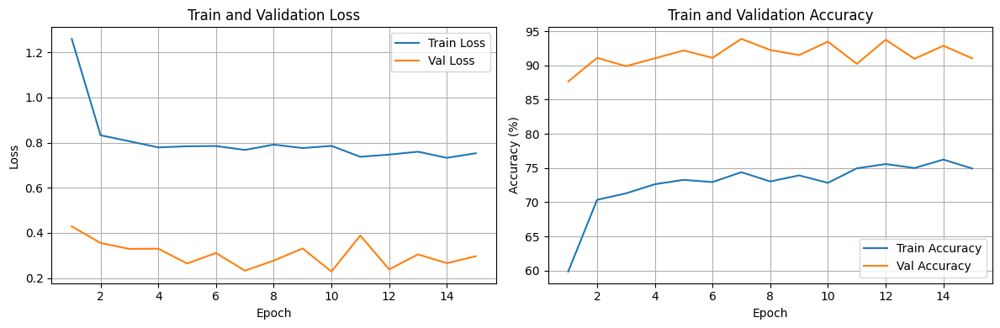

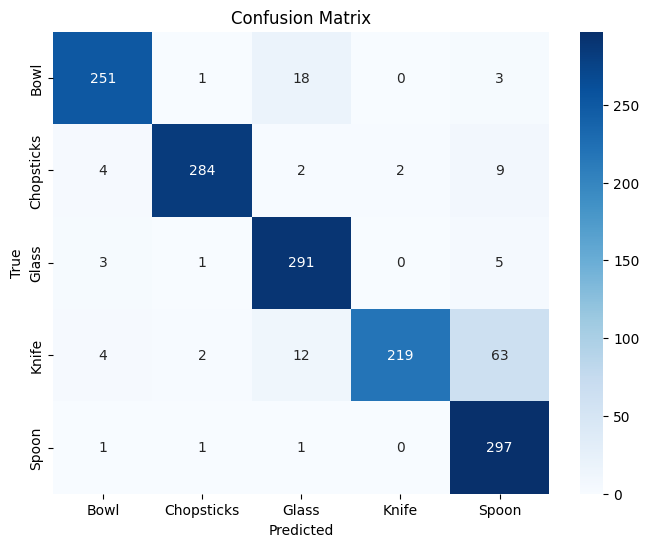


Classification Report:
              precision    recall  f1-score   support

        Bowl       0.95      0.92      0.94       273
  Chopsticks       0.98      0.94      0.96       301
       Glass       0.90      0.97      0.93       300
       Knife       0.99      0.73      0.84       300
       Spoon       0.79      0.99      0.88       300

    accuracy                           0.91      1474
   macro avg       0.92      0.91      0.91      1474
weighted avg       0.92      0.91      0.91      1474



In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
plt.figure(figsize=(12, 4))

# Loss
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train and Validation Loss')
plt.legend()
plt.grid(True)

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_accs) + 1), train_accs, label='Train Accuracy')
plt.plot(range(1, len(val_accs) + 1), val_accs, label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Train and Validation Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# 8. Confusion Matrix
cm = confusion_matrix(val_labels, val_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# 9. Classification Report
print("\nClassification Report:")
print(classification_report(val_labels, val_preds, target_names=label_encoder.classes_))

In [ ]:

# 7. Đánh giá trên tập test
vgg16.eval()
test_correct = 0
test_total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = vgg16(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()

test_acc = 100 * test_correct / test_total
print(f"Test Accuracy: {test_acc:.2f}%")


Test Accuracy: 91.66%


In [ ]:
class MiniVGG(nn.Module):
    def __init__(self, num_classes=5):
        super(MiniVGG, self).__init__()
        self.features = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # Block 2
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # Block 3
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.classifier = nn.Sequential(
        nn.AdaptiveAvgPool2d((1, 1)),
        nn.Flatten(),
        nn.Linear(128, 512),
        nn.ReLU(inplace=True),
        nn.Dropout(0.5),
        nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

# Khởi tạo Mini-VGG
mini_vgg = MiniVGG(num_classes=5).to(device)
summary(mini_vgg, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 224, 224]             896
       BatchNorm2d-2         [-1, 32, 224, 224]              64
              ReLU-3         [-1, 32, 224, 224]               0
            Conv2d-4         [-1, 32, 224, 224]           9,248
       BatchNorm2d-5         [-1, 32, 224, 224]              64
              ReLU-6         [-1, 32, 224, 224]               0
         MaxPool2d-7         [-1, 32, 112, 112]               0
            Conv2d-8         [-1, 64, 112, 112]          18,496
       BatchNorm2d-9         [-1, 64, 112, 112]             128
             ReLU-10         [-1, 64, 112, 112]               0
           Conv2d-11         [-1, 64, 112, 112]          36,928
      BatchNorm2d-12         [-1, 64, 112, 112]             128
             ReLU-13         [-1, 64, 112, 112]               0
        MaxPool2d-14           [-1, 64,

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Chuyển nhãn thành số
label_encoder = LabelEncoder()
Z_encoded = label_encoder.fit_transform(Z)
Z_tensor = torch.tensor(Z_encoded, dtype=torch.long)

# 2. Data Augmentation
transform = {
    "train": transforms.Compose([
        transforms.ToPILImage(),
        transforms.RandomResizedCrop(224, scale=(0.9, 1.0)),  # Giảm tỷ lệ cắt, giữ 80-100% ảnh
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),  # Giảm xoay xuống ±15 độ
        transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05),  # Giảm thay đổi màu sắc
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]),
    "val": transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    "test": transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
}
X_train, X_temp, y_train, y_temp = train_test_split(X, Z_tensor, test_size=0.3, random_state=42, stratify=Z_tensor)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

In [ ]:

# Custom Dataset
class KitchenDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

train_dataset = KitchenDataset(X_train, y_train, transform=transform["train"])
val_dataset = KitchenDataset(X_val, y_val, transform=transform["val"])
test_dataset = KitchenDataset(X_test, y_test, transform=transform["test"])

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)




In [ ]:
#optional
class LabelSmoothingCrossEntropy(nn.Module):
    def __init__(self, smoothing=0.1):
        super(LabelSmoothingCrossEntropy, self).__init__()
        self.smoothing = smoothing
        self.confidence = 1.0 - smoothing

    def forward(self, x, target):
        logprobs = torch.nn.functional.log_softmax(x, dim=-1)
        nll_loss = -logprobs.gather(dim=-1, index=target.unsqueeze(1))
        nll_loss = nll_loss.squeeze(1)
        smooth_loss = -logprobs.mean(dim=-1)
        loss = self.confidence * nll_loss + self.smoothing * smooth_loss
        return loss.mean()

In [ ]:
# 5. Loss và Optimizer
#criterion = LabelSmoothingCrossEntropy(smoothing=0.1)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, mini_vgg.parameters()), lr=0.001, weight_decay=0.0001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2 , patience=5)

# 6. Huấn luyện mô hình
train_losses = []
val_losses = []
train_accs = []
val_accs = []

num_epochs = 50
best_val_loss = float('inf')
patience = 5
counter = 0

for epoch in range(num_epochs):
    mini_vgg.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = mini_vgg(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_losses.append(train_loss)
    train_accs.append(train_acc)

    # Validation
    mini_vgg.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    val_preds = []
    val_labels = []
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = mini_vgg(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
            val_preds.extend(predicted.cpu().numpy())
            val_labels.extend(labels.cpu().numpy())

    val_loss = val_loss / len(val_loader)
    val_acc = 100 * val_correct / val_total
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    scheduler.step(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        counter = 0
        torch.save(mini_vgg.state_dict(), '/content/drive/MyDrive/bestmodel/mini_vgg_best_model.pth')
    else:
        counter += 1
    if counter >= patience:
        print("Early stopping triggered")
        break


Epoch 1/50, Train Loss: 1.3722, Train Acc: 44.29%, Val Loss: 1.2151, Val Acc: 56.99%
Epoch 2/50, Train Loss: 1.2417, Train Acc: 52.68%, Val Loss: 1.2622, Val Acc: 52.17%
Epoch 3/50, Train Loss: 1.1677, Train Acc: 55.75%, Val Loss: 1.0013, Val Acc: 63.57%
Epoch 4/50, Train Loss: 1.1218, Train Acc: 57.45%, Val Loss: 0.9634, Val Acc: 66.08%
Epoch 5/50, Train Loss: 1.0289, Train Acc: 61.71%, Val Loss: 0.9322, Val Acc: 66.62%
Epoch 6/50, Train Loss: 0.9661, Train Acc: 63.17%, Val Loss: 1.0930, Val Acc: 61.26%
Epoch 7/50, Train Loss: 0.9088, Train Acc: 66.53%, Val Loss: 0.8123, Val Acc: 68.52%
Epoch 8/50, Train Loss: 0.8656, Train Acc: 68.36%, Val Loss: 0.7817, Val Acc: 70.76%
Epoch 9/50, Train Loss: 0.8310, Train Acc: 69.68%, Val Loss: 0.6794, Val Acc: 74.76%
Epoch 10/50, Train Loss: 0.7905, Train Acc: 70.99%, Val Loss: 0.6805, Val Acc: 73.81%
Epoch 11/50, Train Loss: 0.7463, Train Acc: 71.89%, Val Loss: 0.6157, Val Acc: 76.93%
Epoch 12/50, Train Loss: 0.7255, Train Acc: 73.45%, Val Loss: 0

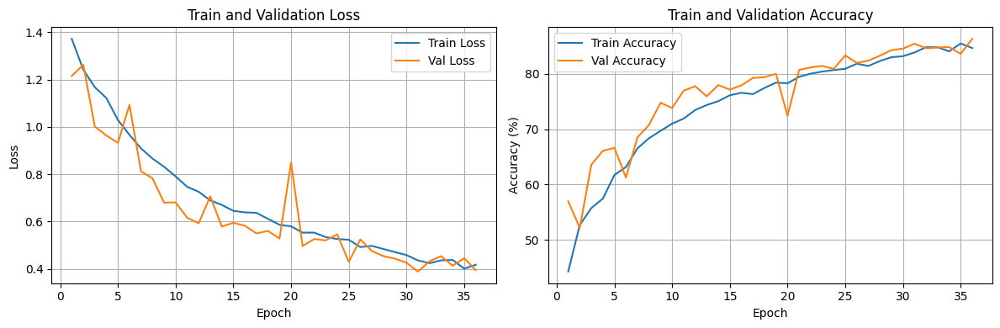

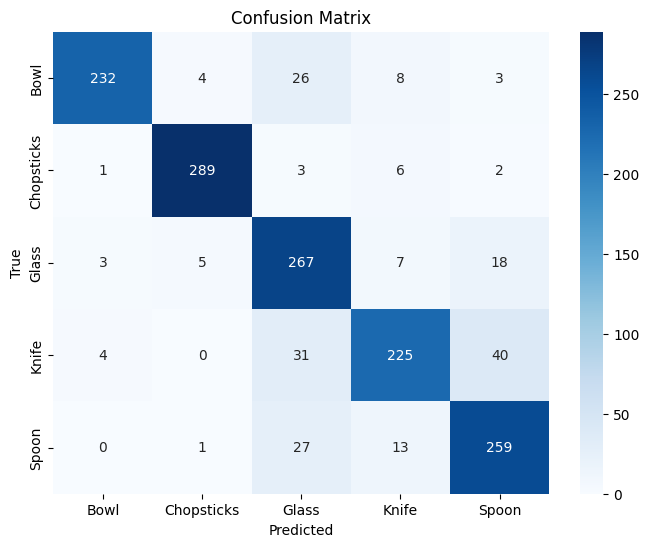


Classification Report:
              precision    recall  f1-score   support

        Bowl       0.97      0.85      0.90       273
  Chopsticks       0.97      0.96      0.96       301
       Glass       0.75      0.89      0.82       300
       Knife       0.87      0.75      0.81       300
       Spoon       0.80      0.86      0.83       300

    accuracy                           0.86      1474
   macro avg       0.87      0.86      0.86      1474
weighted avg       0.87      0.86      0.86      1474



In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
plt.figure(figsize=(12, 4))

# Loss
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train and Validation Loss')
plt.legend()
plt.grid(True)

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_accs) + 1), train_accs, label='Train Accuracy')
plt.plot(range(1, len(val_accs) + 1), val_accs, label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Train and Validation Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# 8. Confusion Matrix
cm = confusion_matrix(val_labels, val_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# 9. Classification Report
print("\nClassification Report:")
print(classification_report(val_labels, val_preds, target_names=label_encoder.classes_))

In [ ]:
 #Load lại mô hình đã lưu
mini_vgg.load_state_dict(torch.load('mini_vgg_best_model.pth'))


num_additional_epochs = 50
initial_epoch = 20
total_epochs = initial_epoch + num_additional_epochs

for epoch in range(initial_epoch, total_epochs):
    mini_vgg.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = mini_vgg(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total

    mini_vgg.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = mini_vgg(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_loss = val_loss / len(val_loader)
    val_acc = 100 * val_correct / val_total

    scheduler.step(val_loss)
    print(f"Epoch {epoch+1}/{total_epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        counter = 0
        torch.save(mini_vgg.state_dict(), 'mini_vgg_best_model.pth')
    else:
        counter += 1
    if counter >= patience:
        print("Early stopping triggered")
        break


<ipython-input-11-17500de151c0>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  mini_vgg.load_state_dict(torch.load('mini_vgg_best_model.pth'))


Epoch 21/70, Train Loss: 1.2590, Train Acc: 47.19%, Val Loss: 0.9817, Val Acc: 62.07%
Epoch 22/70, Train Loss: 1.2524, Train Acc: 48.60%, Val Loss: 0.9837, Val Acc: 62.07%
Epoch 23/70, Train Loss: 1.2367, Train Acc: 49.60%, Val Loss: 1.0348, Val Acc: 60.52%
Epoch 24/70, Train Loss: 1.2225, Train Acc: 49.87%, Val Loss: 1.0242, Val Acc: 61.41%
Epoch 25/70, Train Loss: 1.2129, Train Acc: 50.22%, Val Loss: 0.9770, Val Acc: 62.15%
Epoch 26/70, Train Loss: 1.2079, Train Acc: 51.25%, Val Loss: 0.9119, Val Acc: 64.96%
Epoch 27/70, Train Loss: 1.1886, Train Acc: 51.17%, Val Loss: 0.9820, Val Acc: 63.41%
Epoch 28/70, Train Loss: 1.1735, Train Acc: 53.41%, Val Loss: 0.9755, Val Acc: 62.67%
Epoch 29/70, Train Loss: 1.1666, Train Acc: 52.75%, Val Loss: 0.9337, Val Acc: 65.56%
Epoch 30/70, Train Loss: 1.1499, Train Acc: 54.00%, Val Loss: 1.0549, Val Acc: 62.52%
Epoch 31/70, Train Loss: 1.1499, Train Acc: 53.65%, Val Loss: 1.0765, Val Acc: 58.74%
Epoch 32/70, Train Loss: 1.1336, Train Acc: 54.86%, Va

In [ ]:
mini_vgg.eval()
test_correct = 0
test_total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = mini_vgg(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()

test_acc = 100 * test_correct / test_total
print(f"Test Accuracy: {test_acc:.2f}%")

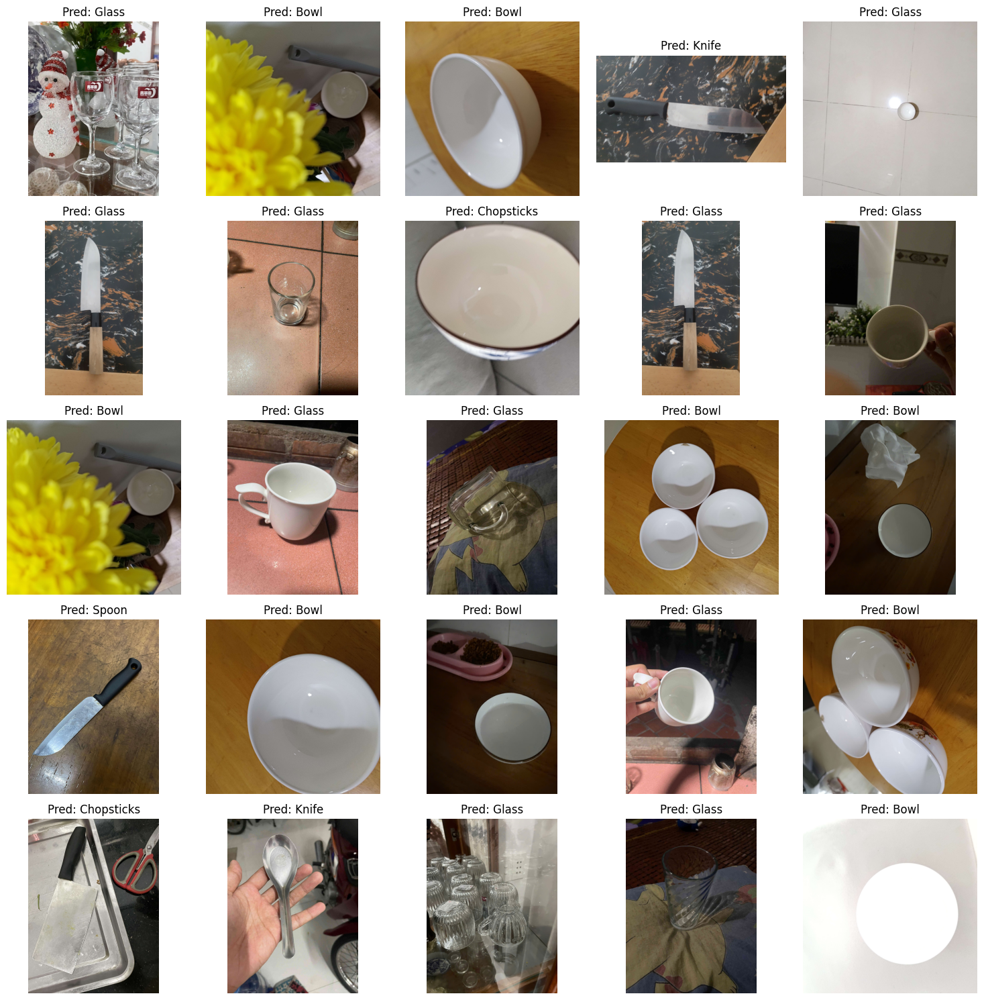

In [ ]:
# 5. Hàm tiền xử lý và dự đoán ảnh
import random
from PIL import Image
def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)
    return image

def predict_image(model, image_path, label_encoder):
    model.eval()
    image = preprocess_image(image_path)
    image = image.to(device)
    with torch.no_grad():
        output = model(image)
        _, predicted = torch.max(output, 1)
    return label_encoder.inverse_transform([predicted.item()])[0]

# 6. Chọn ngẫu nhiên 25 ảnh từ thư mục Test và dự đoán
test_dir = '/content/drive/MyDrive/Kitchen_items/Test'
all_images = [os.path.join(test_dir, img) for img in os.listdir(test_dir) if img.endswith(('.jpg', '.png', '.jpeg'))]
selected_images = random.sample(all_images, min(25, len(all_images)))  # Chọn 25 ảnh ngẫu nhiên

# Dự đoán và lưu kết quả
predictions = []
original_images = []
for img_path in selected_images:
    pred_label = predict_image(mini_vgg, img_path, label_encoder)
    predictions.append(pred_label)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    original_images.append(img)

# 7. Hiển thị kết quả bằng matplotlib
plt.figure(figsize=(15, 15))
for i in range(len(selected_images)):
    plt.subplot(5, 5, i + 1)
    plt.imshow(original_images[i])
    plt.title(f"Pred: {predictions[i]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

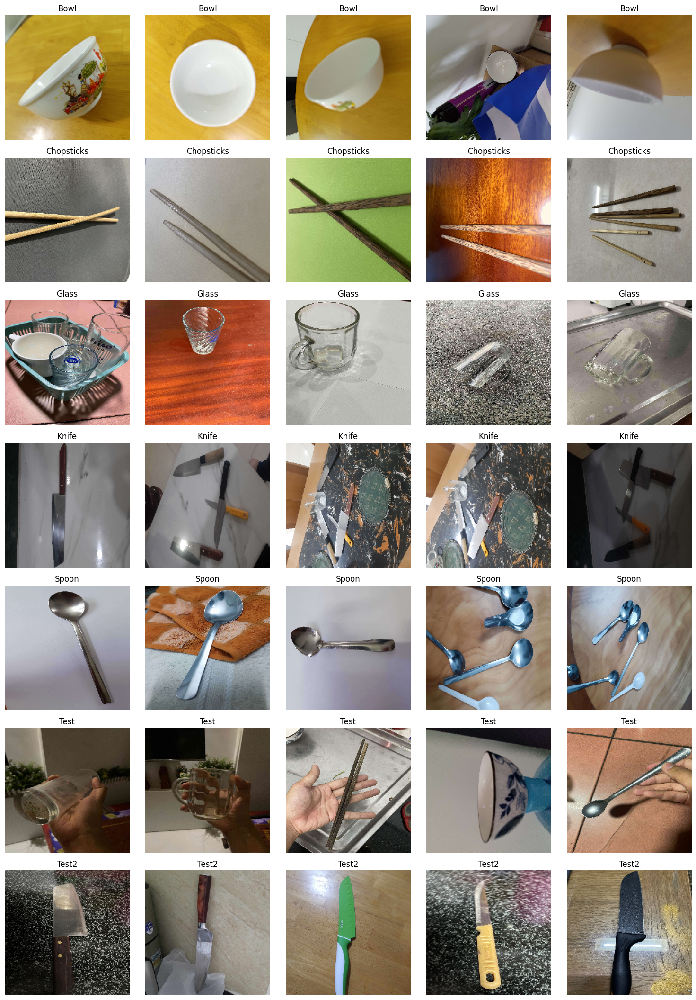

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt
import numpy as np

# Đường dẫn đến thư mục chứa ảnh
data_dir = "/content/drive/MyDrive/Kitchen_items"

# Kích thước ảnh mong muốn
IMG_SIZE = (224, 224)

# Lấy danh sách các lớp (tên thư mục con)
class_names = sorted(os.listdir(data_dir))

# Số ảnh muốn hiển thị mỗi lớp
num_images_per_class = 5

# Số cột để hiển thị ảnh
num_cols = num_images_per_class

plt.figure(figsize=(num_cols * 3, len(class_names) * 3))

for class_idx, class_name in enumerate(class_names):
    class_path = os.path.join(data_dir, class_name)
    if not os.path.isdir(class_path):
        continue  # Bỏ qua nếu không phải thư mục

    # Lấy danh sách file ảnh trong thư mục
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Chọn ngẫu nhiên 5 ảnh (hoặc ít hơn nếu không đủ)
    selected_images = random.sample(image_files, min(num_images_per_class, len(image_files)))

    for i, img_file in enumerate(selected_images):
        img_path = os.path.join(class_path, img_file)
        img = cv2.imread(img_path)  # Đọc ảnh
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Chuyển sang RGB
        img = cv2.resize(img, IMG_SIZE)  # Resize về 224x224

        plt.subplot(len(class_names), num_cols, class_idx * num_cols + i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(class_name)  # Hiển thị nhãn của ảnh

plt.tight_layout()
plt.show()


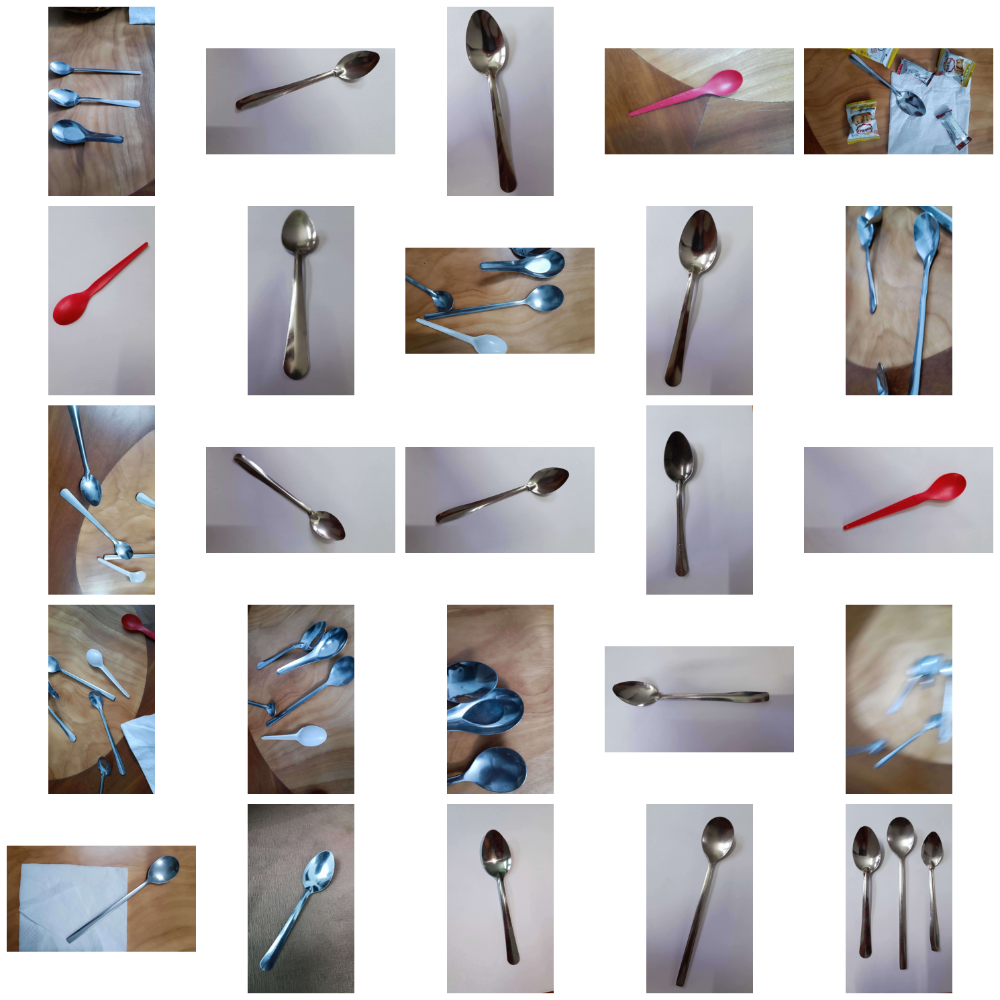

In [ ]:
# prompt: plot 25 random img from /content/drive/MyDrive/Kitchen_items/Bowl

import matplotlib.pyplot as plt
import random
import os
import cv2

# Directory containing the images
image_dir = '/content/drive/MyDrive/Kitchen_items/Spoon'

# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]

# Select 25 random images
selected_images = random.sample(image_files, min(25, len(image_files)))

# Create a figure and axes for the subplots
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.ravel()

# Iterate through the selected images and display them
for i, image_file in enumerate(selected_images):
  image_path = os.path.join(image_dir, image_file)
  try:
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    axes[i].imshow(img)
    axes[i].axis('off')
  except Exception as e:
    print(f"Error loading or displaying {image_file}: {e}")
    axes[i].axis('off') # Turn off the axes for any failed plots

plt.tight_layout()
plt.show()


In [ ]:
import torch
import torchvision.models as models

# Load mô hình ResNet-18
resnet18 = models.resnet18()
num_features = resnet18.fc.in_features
resnet18.fc = nn.Sequential(
    nn.Linear(num_features, 256),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(256, 5)
)
# Load trọng số đã lưu, ensuring the model structure matches the saved state_dict
resnet18.load_state_dict(torch.load("resnet18_best_model.pth", map_location=torch.device('cpu')))


# Kiểm tra kiến trúc
print(resnet18)
# Hiển thị danh sách các layers và trọng số tương ứng
for name, param in resnet18.named_parameters():
    print(f"Layer: {name} | Shape: {param.shape}")
# Access the weights of the specific Linear layers within the Sequential object
print(resnet18.fc[0].weight) # Access the weight of the first Linear layer
print(resnet18.fc[3].weight) # Access the weight of the second Linear layer (index 3)
print(resnet18.fc[0].bias) # Access the bias of the first Linear layer
print(resnet18.fc[3].bias) # Access the bias of the second Linear layer (index 3)

from PIL import Image
import torchvision.transforms as transforms

# Load ảnh và tiền xử lý
img_path = "/content/drive/MyDrive/Kitchen_items/Test/IMG_6018.jpg"  # Thay bằng ảnh test
image = Image.open(img_path)

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

image = transform(image).unsqueeze(0)  # Thêm batch dimension

# Chuyển mô hình về chế độ đánh giá
resnet18.eval()

# Dự đoán
with torch.no_grad():
    output = resnet18(image)
    predicted_class = torch.argmax(output, dim=1).item()

print(f"Dự đoán lớp: {predicted_class}")

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

<ipython-input-128-5c733ef00a1b>:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet18.load_state_dict(torch.load("resnet18_best_model.pth", map_location=torch.device('